<h1>Testing the Explainer</h1>
This model is taken from https://keras.io/examples/timeseries/timeseries_weather_forecasting/



In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras

In [2]:
from zipfile import ZipFile
import os

uri = "https://storage.googleapis.com/tensorflow/tf-keras-datasets/jena_climate_2009_2016.csv.zip"
zip_path = keras.utils.get_file(origin=uri, fname="jena_climate_2009_2016.csv.zip")
zip_file = ZipFile(zip_path)
zip_file.extractall()
csv_path = "jena_climate_2009_2016.csv"

df = pd.read_csv(csv_path)


In [3]:
titles = [
    "Pressure",
    "Temperature",
    "Temperature in Kelvin",
    "Temperature (dew point)",
    "Relative Humidity",
    "Saturation vapor pressure",
    "Vapor pressure",
    "Vapor pressure deficit",
    "Specific humidity",
    "Water vapor concentration",
    "Airtight",
    "Wind speed",
    "Maximum wind speed",
    "Wind direction in degrees",
]

feature_keys = [
    "p (mbar)",
    "T (degC)",
    "Tpot (K)",
    "Tdew (degC)",
    "rh (%)",
    "VPmax (mbar)",
    "VPact (mbar)",
    "VPdef (mbar)",
    "sh (g/kg)",
    "H2OC (mmol/mol)",
    "rho (g/m**3)",
    "wv (m/s)",
    "max. wv (m/s)",
    "wd (deg)",
]

colors = [
    "blue",
    "orange",
    "green",
    "red",
    "purple",
    "brown",
    "pink",
    "gray",
    "olive",
    "cyan",
]

date_time_key = "Date Time"


def show_raw_visualization(data):
    time_data = data[date_time_key]
    fig, axes = plt.subplots(
        nrows=7, ncols=2, figsize=(15, 20), dpi=80, facecolor="w", edgecolor="k"
    )
    for i in range(len(feature_keys)):
        key = feature_keys[i]
        c = colors[i % (len(colors))]
        t_data = data[key]
        t_data.index = time_data
        t_data.head()
        ax = t_data.plot(
            ax=axes[i // 2, i % 2],
            color=c,
            title="{} - {}".format(titles[i], key),
            rot=25,
        )
        ax.legend([titles[i]])
    plt.tight_layout()



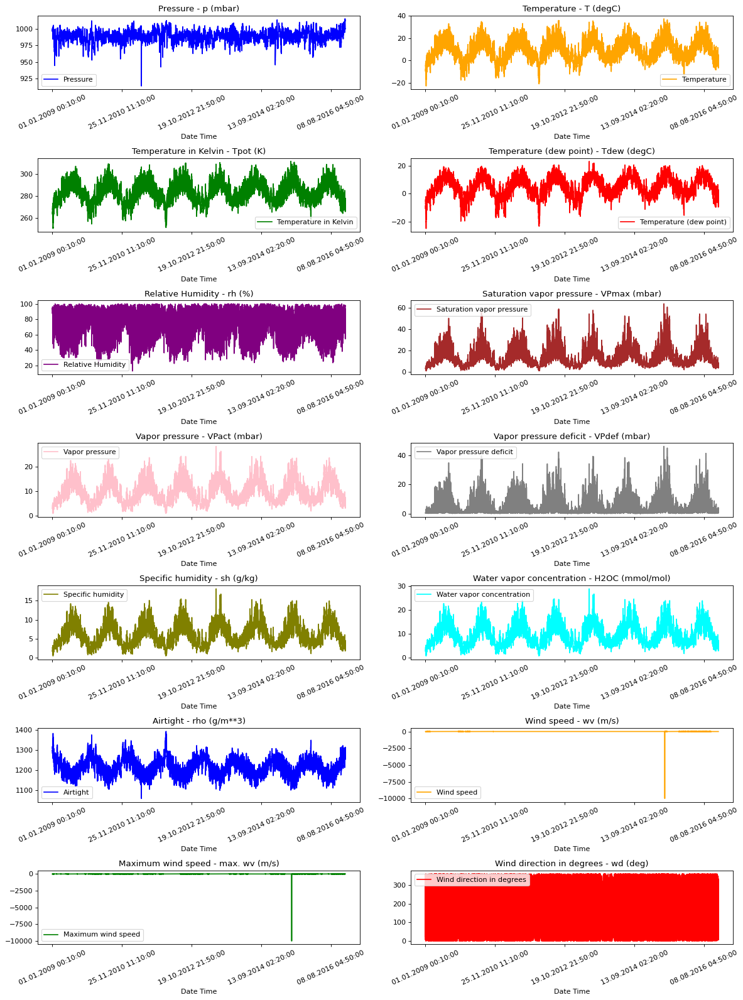

In [8]:
show_raw_visualization(df)

C:\Users\Admin\AppData\Local\Temp/ipykernel_19696/3897922630.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  plt.matshow(data.corr())


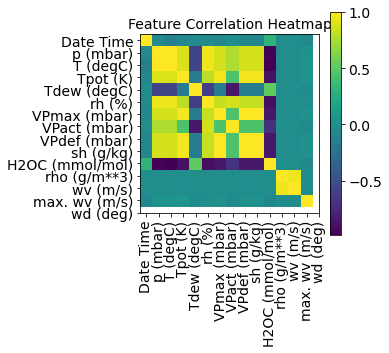

In [10]:
def show_heatmap(data):
    plt.matshow(data.corr())
    plt.xticks(range(data.shape[1]), data.columns, fontsize=14, rotation=90)
    plt.gca().xaxis.tick_bottom()
    plt.yticks(range(data.shape[1]), data.columns, fontsize=14)

    cb = plt.colorbar()
    cb.ax.tick_params(labelsize=14)
    plt.title("Feature Correlation Heatmap", fontsize=14)
    plt.show()


show_heatmap(df)

In [4]:
split_fraction = 0.715
train_split = int(split_fraction * int(df.shape[0]))
step = 6

past = 720
future = 72
learning_rate = 0.001
batch_size = 256
epochs = 10


def normalize(data, train_split):
    data_mean = data[:train_split].mean(axis=0)
    data_std = data[:train_split].std(axis=0)
    return (data - data_mean) / data_std


In [5]:
print(
    "The selected parameters are:",
    ", ".join([titles[i] for i in [0, 1, 5, 7, 8, 10, 11]]),
)
selected_features = [feature_keys[i] for i in [0, 1, 5, 7, 8, 10, 11]]
features = df[selected_features]
features.index = df[date_time_key]
features.head()

features = normalize(features.values, train_split)
features = pd.DataFrame(features)
features.head()

train_data = features.loc[0 : train_split - 1]
val_data = features.loc[train_split:]


The selected parameters are: Pressure, Temperature, Saturation vapor pressure, Vapor pressure deficit, Specific humidity, Airtight, Wind speed


In [6]:
start = past + future
end = start + train_split

x_train = train_data[[i for i in range(7)]].values
y_train = features.iloc[start:end][[1]]

sequence_length = int(past / step)


In [7]:
selected_features

['p (mbar)',
 'T (degC)',
 'VPmax (mbar)',
 'VPdef (mbar)',
 'sh (g/kg)',
 'rho (g/m**3)',
 'wv (m/s)']

In [8]:
dataset_train = keras.preprocessing.timeseries_dataset_from_array(
    x_train,
    y_train,
    sequence_length=sequence_length,
    sampling_rate=step,
    batch_size=batch_size,
)

In [9]:
x_end = len(val_data) - past - future

label_start = train_split + past + future

x_val = val_data.iloc[:x_end][[i for i in range(7)]].values
y_val = features.iloc[label_start:][[1]]

dataset_val = keras.preprocessing.timeseries_dataset_from_array(
    x_val,
    y_val,
    sequence_length=sequence_length,
    sampling_rate=step,
    batch_size=batch_size,
)


for batch in dataset_train.take(1):
    inputs, targets = batch

print("Input shape:", inputs.numpy().shape)
print("Target shape:", targets.numpy().shape)


Input shape: (256, 120, 7)
Target shape: (256, 1)


In [20]:
inputs = keras.layers.Input(shape=(inputs.shape[1], inputs.shape[2]))
lstm_out = keras.layers.LSTM(32)(inputs)
outputs = keras.layers.Dense(1)(lstm_out)

model = keras.Model(inputs=inputs, outputs=outputs)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=learning_rate), loss="mse")
model.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 120, 7)]          0         
                                                                 
 lstm_1 (LSTM)               (None, 32)                5120      
                                                                 
 dense_1 (Dense)             (None, 1)                 33        
                                                                 
Total params: 5,153
Trainable params: 5,153
Non-trainable params: 0
_________________________________________________________________


In [21]:
path_checkpoint = "model_checkpoint.h5"
es_callback = keras.callbacks.EarlyStopping(monitor="val_loss", min_delta=0, patience=5)

modelckpt_callback = keras.callbacks.ModelCheckpoint(
    monitor="val_loss",
    filepath=path_checkpoint,
    verbose=1,
    save_weights_only=True,
    save_best_only=True,
)

history = model.fit(
    dataset_train,
    epochs=epochs,
    validation_data=dataset_val,
    callbacks=[es_callback, modelckpt_callback],
)


Epoch 1/10
1172/1172 [==============================] - ETA: 0s - loss: 0.2057
Epoch 1: val_loss improved from inf to 0.14899, saving model to model_checkpoint.h5
1172/1172 [==============================] - 220s 186ms/step - loss: 0.2057 - val_loss: 0.1490
Epoch 2/10
1172/1172 [==============================] - ETA: 0s - loss: 0.1217
Epoch 2: val_loss improved from 0.14899 to 0.14427, saving model to model_checkpoint.h5
1172/1172 [==============================] - 257s 219ms/step - loss: 0.1217 - val_loss: 0.1443
Epoch 3/10
1172/1172 [==============================] - ETA: 0s - loss: 0.1124
Epoch 3: val_loss did not improve from 0.14427
1172/1172 [==============================] - 276s 236ms/step - loss: 0.1124 - val_loss: 0.1456
Epoch 4/10
1172/1172 [==============================] - ETA: 0s - loss: 0.1101
Epoch 4: val_loss did not improve from 0.14427
1172/1172 [==============================] - 264s 225ms/step - loss: 0.1101 - val_loss: 0.1458
Epoch 5/10
1172/1172 [================

In [22]:
model.save("sample_model.h5")

In [10]:
from tensorflow.keras.models import load_model
model = load_model("sample_model.h5")

8/8 [==============================] - 1s 28ms/step


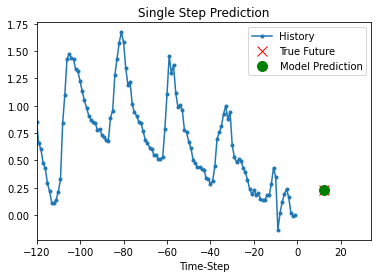

In [11]:
def show_plot(plot_data, delta, title):
    labels = ["History", "True Future", "Model Prediction"]
    marker = [".-", "rx", "go"]
    time_steps = list(range(-(plot_data[0].shape[0]), 0))
    if delta:
        future = delta
    else:
        future = 0

    plt.title(title)
    for i, val in enumerate(plot_data):
        if i:
            plt.plot(future, plot_data[i], marker[i], markersize=10, label=labels[i])
        else:
            plt.plot(time_steps, plot_data[i].flatten(), marker[i], label=labels[i])
    plt.legend()
    plt.xlim([time_steps[0], (future + 5) * 2])
    plt.xlabel("Time-Step")
    plt.show()
    return

sample = None
for x, y in dataset_val.take(1):
    sample = x
    show_plot(
        [x[0][:, 1].numpy(), y[0].numpy(), model.predict(x)[0]],
        12,
        "Single Step Prediction",
    )


In [12]:
import sys
sys.path.append("./")

<h2>Here, we will test out our explainer</h2>

In [13]:
from explainer import Explainer

In [23]:
sample[0]

<tf.Tensor: shape=(120, 7), dtype=float64, numpy=
array([[-1.09200151e-01,  8.55794169e-01,  7.17157085e-01,
        -7.23987923e-02,  1.38484700e+00, -8.79576612e-01,
        -9.42550885e-01],
       [-1.04338730e-01,  6.56605184e-01,  4.59283771e-01,
        -4.86642859e-01,  1.38856578e+00, -7.06029721e-01,
        -1.01458496e+00],
       [-1.27430482e-01,  6.03333712e-01,  3.94164247e-01,
        -5.26193800e-01,  1.31419017e+00, -6.61725085e-01,
        -8.50871155e-01],
       [-1.27430482e-01,  4.78261558e-01,  2.49598905e-01,
        -6.67744536e-01,  1.21006431e+00, -5.46924673e-01,
        -9.62196541e-01],
       [-1.50522234e-01,  4.29622388e-01,  1.94898505e-01,
        -6.32356852e-01,  1.07246943e+00, -5.03109590e-01,
        -9.75293645e-01],
       [-1.52952944e-01,  2.90653328e-01,  4.64259911e-02,
        -7.34356648e-01,  9.19999426e-01, -3.73133005e-01,
        -1.19794442e+00],
       [-1.85767539e-01,  2.16536497e-01, -2.78102659e-02,
        -7.48928047e-01,  8

In [24]:
sample_2 = sample[3,:, :]
import numpy as np
sample_2 = np.array([sample_2])


In [25]:
from sklearn.tree import DecisionTreeRegressor

In [27]:
explainer = Explainer(model, sample_2[0], surrogate_model=DecisionTreeRegressor(max_depth=5))

In [29]:
explainer.generate_neigbouring_datapoints()

In [32]:
def flatten(array):
    result = []
    for i in array:
        result.append(i.flatten())
    result = np.array(result)
    return result


def combine_to_df(array):
    df = pd.DataFrame(array)
    cols = []
    for i in range(0, 120):
      for j in selected_features:
            cols.append(j + "_" + str(i))
    df.columns = cols
    print(df.to_string())
    return df
    

In [33]:
explainer.explain(pipeline=[flatten, combine_to_df])

41/41 [==============================] - 1s 20ms/step
      p (mbar)_0  T (degC)_0  VPmax (mbar)_0  VPdef (mbar)_0  sh (g/kg)_0  rho (g/m**3)_0  wv (m/s)_0  p (mbar)_1  T (degC)_1  VPmax (mbar)_1  VPdef (mbar)_1  sh (g/kg)_1  rho (g/m**3)_1  wv (m/s)_1  p (mbar)_2  T (degC)_2  VPmax (mbar)_2  VPdef (mbar)_2  sh (g/kg)_2  rho (g/m**3)_2  wv (m/s)_2  p (mbar)_3  T (degC)_3  VPmax (mbar)_3  VPdef (mbar)_3  sh (g/kg)_3  rho (g/m**3)_3  wv (m/s)_3  p (mbar)_4  T (degC)_4  VPmax (mbar)_4  VPdef (mbar)_4  sh (g/kg)_4  rho (g/m**3)_4  wv (m/s)_4  p (mbar)_5  T (degC)_5  VPmax (mbar)_5  VPdef (mbar)_5  sh (g/kg)_5  rho (g/m**3)_5  wv (m/s)_5  p (mbar)_6  T (degC)_6  VPmax (mbar)_6  VPdef (mbar)_6  sh (g/kg)_6  rho (g/m**3)_6  wv (m/s)_6  p (mbar)_7  T (degC)_7  VPmax (mbar)_7  VPdef (mbar)_7  sh (g/kg)_7  rho (g/m**3)_7  wv (m/s)_7  p (mbar)_8  T (degC)_8  VPmax (mbar)_8  VPdef (mbar)_8  sh (g/kg)_8  rho (g/m**3)_8  wv (m/s)_8  p (mbar)_9  T (degC)_9  VPmax (mbar)_9  VPdef (mbar)_9  sh (g/kg)_9

In [35]:
feature_importance = pd.DataFrame(explainer.surrogate_model.feature_importances_)

In [36]:
cols = []
for i in range(0, 120):
  for j in selected_features:
    cols.append(j + "_" + str(i))
feature_importance.index = cols

In [37]:
feature_importance.sort_values(by=0, ascending=False).head(10)

,0
T (degC)_62,0.224693
VPmax (mbar)_76,0.175768
sh (g/kg)_57,0.096371
sh (g/kg)_118,0.090609
VPmax (mbar)_95,0.075295
VPmax (mbar)_113,0.071514
sh (g/kg)_98,0.055085
VPmax (mbar)_62,0.052953
VPmax (mbar)_94,0.034902
sh (g/kg)_56,0.027964


We observe that VPmax plays and sh carries significant feature importance.
